# Problem 2: Stereo Vision

The main objective of this pipeline is to compute depth images from 3 datasets given, each dataset consists of 2 images and information about calibration matrix, baseline, focal lengths.

General pipeline:
1. Identify matching features between the two images in each dataset using any feature matching algorithms.
2. Estimate the Fundamental matrix using RANSAC method based on the matched features.
3. Compute the Essential matrix from the Fundamental matrix considering calibration parameters.
4. Decompose the Essential matrix into rotation and translation matrices.
5. Apply perspective transformation to rectify images and ensure horizontal epipolar lines.
6. Print the homography matrices (H1 and H2) for rectification.
7. Visualize epipolar lines and feature points on both rectified images.

8. Calculate the disparity map representing the pixel-wise differences between the two images.
9. Rescale the disparity map and save it as grayscale and color images using heat map conversion.
10. Utilize the disparity information to compute depth values for each pixel.
11. Generate a depth image representing the spatial dimensions of the scene.
12. Save the depth image as grayscale and color using heat map conversion for visualization.

**Dataset 1** :
The following dataset consists of classroom images

In [ ]:
import os
from google.colab import drive
from google.colab.patches import cv2_imshow
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import glob
# Mount your Google Drive for file access
drive.mount('/content/drive/')
import random

path_to_folder = "ENPM673/classroom"
%cd /content/drive/My\ Drive/{path_to_folder}


Mounted at /content/drive/
/content/drive/My Drive/ENPM673/classroom


1. features function: This function processes two images to detect keypoints using the Scale-Invariant Feature Transform (SIFT) and then matches these keypoints using the FLANN-based matcher. It calculates the fundamental matrix using matched points, which is useful in determining the epipolar geometry between the two images.
2. point_match function: This function performs 3D triangulation of matched point pairs (inliers) using the projection matrices of the two camera views. It projects the 2D points into 3D space to reconstruct their positions.
3. decompose_essential_matrix function : This function decomposes the essential matrix to extract possible rotation and translation matrices that describe the camera movement between two views. It uses the essential matrix derived from the fundamental matrix and the camera intrinsic parameters.


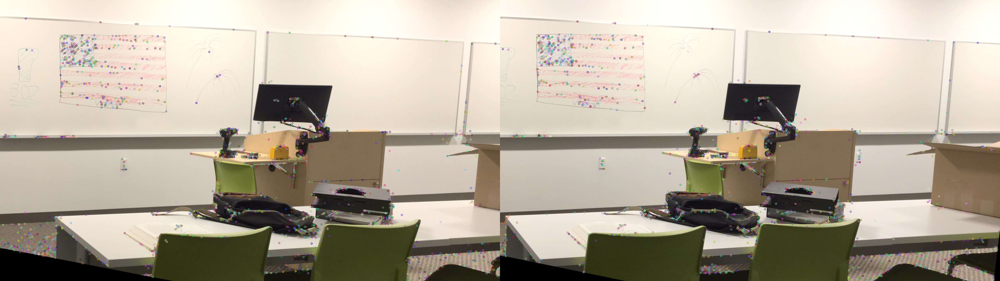

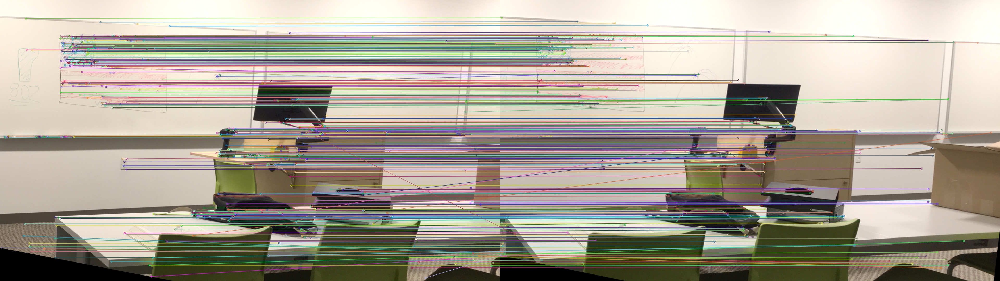

funda matrix [[-3.00307938e-08 -3.86035426e-05  2.92561580e-02]
 [ 3.90141509e-05 -3.68883223e-06 -4.07864237e-01]
 [-2.90919811e-02  4.07106675e-01  1.00000000e+00]]


Essential matrix = 
  [[ 0.07799008 -0.13784358  0.04953845]
 [-0.05325756  0.44007104  0.896143  ]
 [-0.46041553  0.77025148 -0.40941624]]


Rotation matrix [[-0.87119336 -0.49090847  0.0055686 ]
 [ 0.44859444 -0.79138972  0.41528946]
 [-0.19946218  0.36429546  0.90967228]]
Translation matrix [[0.9861352 ]
 [0.02070811]
 [0.16464671]]


In [ ]:
def features(image_1, image_2, x):
    image_1 = cv.imread(image_1)
    image_2 = cv.imread(image_2)
    #x = 200
    gray1 = cv.cvtColor(image_1, cv.COLOR_BGR2GRAY)
    gray2 = cv.cvtColor(image_2, cv.COLOR_BGR2GRAY)

    sift = cv.SIFT_create()
    keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)

    image_with_keypoints1 = cv.drawKeypoints(image_1, keypoints1, None)
    image_with_keypoints2 = cv.drawKeypoints(image_2, keypoints2, None)

    features_both_images = np.concatenate((image_with_keypoints1, image_with_keypoints2), axis=1)

    #print(features_both_images, "detected features in both the images")

    cv2_imshow(features_both_images)

    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    flann = cv.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)

    # Need to draw only good matches, so create a mask
    matchesMask = [[0, 0] for i in range(len(matches))]
    good_matches = []
    for i, (m, n) in enumerate(matches):
        if m.distance < 0.7*n.distance:
           # matchesMask[i] = [1, 0]
            good_matches.append(m)

    points1 = np.float32([keypoints1[m.queryIdx].pt for m in good_matches])
    points2 = np.float32([keypoints2[m.trainIdx].pt for m in good_matches])

    # Compute Fundamental Matrix
    F, mask = cv.findFundamentalMat(points1, points2, cv.FM_RANSAC)

    # We select only inlier points
    inlier_points1 = points1[mask.ravel() == 1]
    inlier_points2 = points2[mask.ravel() == 1]



    matched_features = cv.drawMatches(image_1, keypoints1,image_2, keypoints2, good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    cv2_imshow(matched_features)
    cv.waitKey(0)
    cv.destroyAllWindows()
    return inlier_points1, inlier_points2, F



img_1 = ('im0.png')
img_2 = ('im1.png')
inlier_points1, inlier_points2, F_matrix = features(img_1, img_2, 250)

print("funda matrix", F_matrix)
def point_match_function(points1, points2, projection_matrix_l, projection_matrix_r):

     points1_homo = cv.convertPointsToHomogeneous(points1)
     points2_homo = cv.convertPointsToHomogeneous(points2)

     points1_homo = points1_homo.reshape(-1, 3)[:, :2].T  # Take only x, y from Nx3 and transpose to 2xN
     points2_homo = points2_homo.reshape(-1, 3)[:, :2].T  # Same for points2

    # Triangulate points
     points3D_homo = cv.triangulatePoints(projection_matrix_l, projection_matrix_r, points1_homo, points2_homo)

    # Convert from homogeneous to 3D points
     points3D = cv.convertPointsFromHomogeneous(points3D_homo.T)

    # points3D is a n x 1 x 3 array, we need to reshape it to n x 3
     return points3D.reshape(-1, 3)


best_points_calc1 = inlier_points1
best_points_calc2 = inlier_points2

K_matrix = np.array([[1746.24, 0, 14.88 ],
                  [0, 1746.24, 534.11],
                  [0, 0, 1]])




E = K_matrix.T @ F_matrix @ K_matrix

U, S, Vt = np.linalg.svd(E)

E = U @ np.diag([1, 1, 0]) @ Vt.T

print("\n")
print("Essential matrix = \n ", E)
print("\n")

U, S, Vt = np.linalg.svd(E)

W = np.array([[0, -1, 0 ],
              [1, 0, 0],
              [0, 0, 1]])
def decompose_essential_matrix(E):
    retval, R, t, mask = cv.recoverPose(E, best_points_calc1, best_points_calc2, focal=1746.24, pp=(14.88, 534.11))
    return R, t

Rot_mat, T_mat = decompose_essential_matrix(E)

print("Rotation matrix", Rot_mat)
print("Translation matrix", T_mat)

1. drawlines_rectified function :  Draws epipolar lines and points on rectified images for visualization, helping validate the stereo rectification and epipolar geometry correctness.
2. rectification function : Computes homography matrices for rectifying stereo images, aligning corresponding epipolar lines horizontally to simplify disparity estimation.
3. rectified_epilines function : Applies rectification transformations to images and points, then calculates and visualizes epipolar lines on these rectified images.

4. drawlines function : Similar to drawlines_rectified but for unrectified images, this function visualizes epipolar lines and points on original images to assess the raw epipolar geometry before rectification.
5. un_rectified_epiplines function : Computes and visualizes epipolar lines on unrectified images, providing a before-and-after comparison relative to rectification results.




Homography matrix for left image  = 
 [[-3.68005997e-01  5.16099122e-02 -1.67449645e+01]
 [ 3.21286096e-02 -4.07820523e-01 -3.24258079e+01]
 [ 4.30410050e-05 -3.11272853e-06 -4.50679357e-01]]


Homography matrix for right image  = 
 [[-3.68005997e-01  5.16099122e-02 -1.67449645e+01]
 [ 3.21286096e-02 -4.07820523e-01 -3.24258079e+01]
 [ 4.30410050e-05 -3.11272853e-06 -4.50679357e-01]]




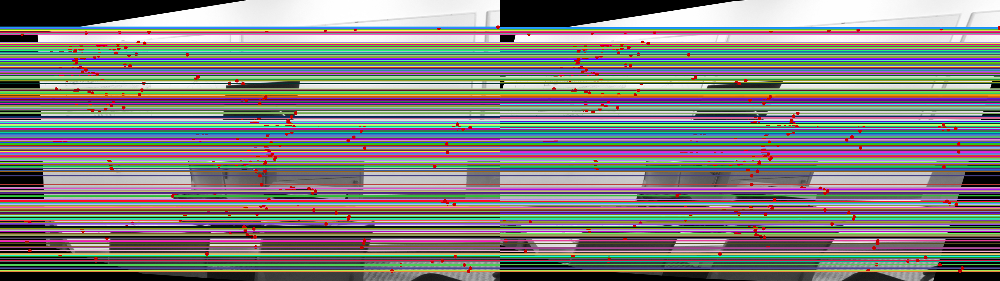

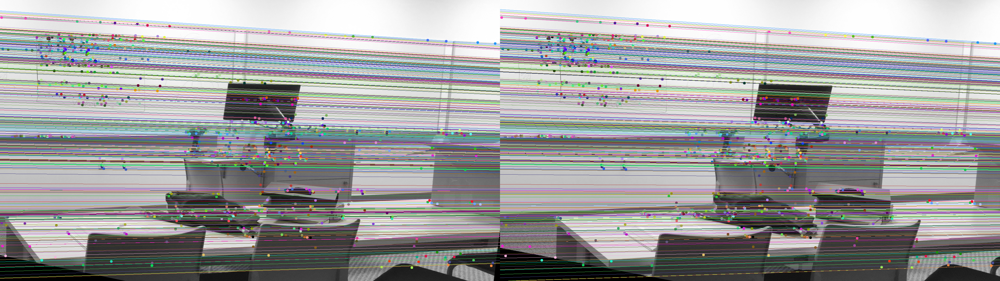

In [ ]:
def drawlines_rectified(img1src, img2src, lines, pts1src, pts2src):

    img1color = cv.cvtColor(img1src, cv.COLOR_GRAY2BGR)
    img2color = cv.cvtColor(img2src, cv.COLOR_GRAY2BGR)

    np.random.seed(0)

    r, c = img1src.shape

    for r, pt1, pt2 in zip(lines, pts1src, pts2src):

        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, pt1[1]])
        x1, y1 = map(int, [c, pt1[1]])
        img1color = cv.line(img1color, (x0, y0), (x1, y1), color, 3)
        img1color = cv.circle((img1color), (int(pt1[0]), int(pt1[1])), 7, (0, 0, 200), -1)

        x0, y0 = map(int, [0, pt2[1]])
        x1, y1 = map(int, [c, pt2[1]])
        img2color = cv.line((img2color), (x0, y0), (x1, y1), (color), 3)
        img2color = cv.circle(img2color, (int(pt2[0]), int(pt2[1])), 7, (0, 0, 200), -1)

    return img1color, img2color

def rectification(imag1, imag2):
    h1, w1 = imag1.shape[:2]
    h2, w2 = imag2.shape[:2]

    retval, H1, H2 = cv.stereoRectifyUncalibrated(np.float32(best_points_calc1), np.float32(best_points_calc2), F_matrix, imgSize=(w1, h1))

    print("\n")
    print("Homography matrix for left image  = \n", H1)
    print("\n")
    print("Homography matrix for right image  = \n", H1)
    print("\n")

    return H1, H2, (w1, h1), (w2, h2)
# Convert images to grayscale if not already done in 'features'
gray1 = cv.cvtColor(cv.imread(img_1), cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(cv.imread(img_2), cv.COLOR_BGR2GRAY)

# Rectification of Images
H1, H2, image1_size, image2_size = rectification(gray1, gray2)
img1_rectified = cv.warpPerspective(gray1, H1, image1_size)
img2_rectified = cv.warpPerspective(gray2, H2, image2_size)

def rectified_epilines(imag1, imag2):

    img1_rectified = cv.warpPerspective(imag1, H1, image1_size)
    img2_rectified = cv.warpPerspective(imag2, H2, image2_size)

    points1_rectified = cv.perspectiveTransform(best_points_calc1.reshape(-1, 1, 2), H1).reshape(-1,2)
    points2_rectified = cv.perspectiveTransform(best_points_calc2.reshape(-1, 1, 2), H2).reshape(-1,2)

    lines1 = cv.computeCorrespondEpilines(
        points2_rectified.reshape(-1, 1, 2), 2, F_matrix)
    lines1 = lines1.reshape(-1, 3)
    img5, img6 = drawlines_rectified(img1_rectified, img2_rectified, lines1, points1_rectified, points2_rectified)

    lines2 = cv.computeCorrespondEpilines(
        points1_rectified.reshape(-1, 1, 2), 1, F_matrix)
    lines2 = lines2.reshape(-1, 3)
    img3, img4 = drawlines_rectified(img2_rectified, img1_rectified, lines2, points2_rectified, points1_rectified)

    result = np.concatenate((img3, img5), axis=1)
    horizontal_concat = cv.hconcat([img1_rectified, img2_rectified])

    return result, horizontal_concat, img1_rectified, img2_rectified

# Draw Epipolar Lines on Rectified Images
result, horizontal_concat, img1_rectified, img2_rectified = rectified_epilines(img1_rectified, img2_rectified)
cv2_imshow(result)
cv.waitKey(0)
cv.destroyAllWindows()
def drawlines(img1, img2, lines, pts1, pts2):
    r, c = img1.shape

    color1 = cv.cvtColor(img1, cv.COLOR_GRAY2BGR)
    color2 = cv.cvtColor(img2, cv.COLOR_GRAY2BGR)

    np.random.seed(0)
    for r, pt1, pt2 in zip(lines, pts1, pts2):

        color = tuple(np.random.randint(0, 255, 3).tolist())

        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])

        image_colour_1 = cv.line(color1, (x0, y0), (x1, y1), color, 1)
        imag1_with_lines = cv.circle(image_colour_1, (int(pt1[0]), int(pt1[1])), 5, color, -1)
        imag2_with_lines = cv.circle(image_colour_1, (int(pt2[0]), int(pt2[1])), 5, color, -1)

    return imag1_with_lines, imag2_with_lines

def un_rectified_epiplines(imag1, imag2, src_pts1, src_pts2):

    lines1 = cv.computeCorrespondEpilines(
        src_pts2.reshape(-1, 1, 2), 2, F_matrix)
    lines1 = lines1.reshape(-1, 3)
    img5, img6 = drawlines(imag1, imag2, lines1, src_pts1, src_pts2)

    lines2 = cv.computeCorrespondEpilines(
        src_pts1.reshape(-1, 1, 2), 1, F_matrix)
    lines2 = lines2.reshape(-1, 3)
    img3, img4 = drawlines(imag2, imag1, lines2, src_pts2, src_pts1)

    result = np.concatenate((img3, img5), axis=1)

    return result

# Optionally, draw epipolar lines on unrectified images
before_rectified_epiplines = un_rectified_epiplines(gray1, gray2, inlier_points1, inlier_points2)
cv2_imshow(before_rectified_epiplines)
cv.waitKey(0)
cv.destroyAllWindows()


1. Function: StereoBM_create:
- This function initializes a block matching stereo disparity algorithm. StereoBM (Block Matching) is one of the simplest and fastest disparity algorithms provided by OpenCV but is often sensitive to noise and texture.
- Normalizes the disparity values to a 0-1 range for visualization purposes. Normalization makes it easier to observe the disparity variations in a visible format.
2. disparity_to_depth function:
-  Converts disparity values to depth measurements using the camera's baseline and focal length. This function directly relates the disparity map to physical distances, providing a depth map that represents real-world measurements.
**Visualization**:
Shows disparity maps and depth maps in both grayscale and heatmap color mappings to highlight depth variations visually.


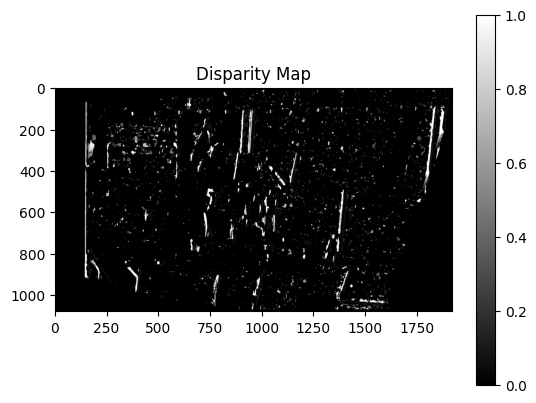

<ipython-input-71-505e5db91e65>:29: RuntimeWarning: divide by zero encountered in divide
  depth_map[i][j] = 1/img[i][j]
<ipython-input-71-505e5db91e65>:30: RuntimeWarning: divide by zero encountered in divide
  depth_array[i][j] = baseline*f/img[i][j]


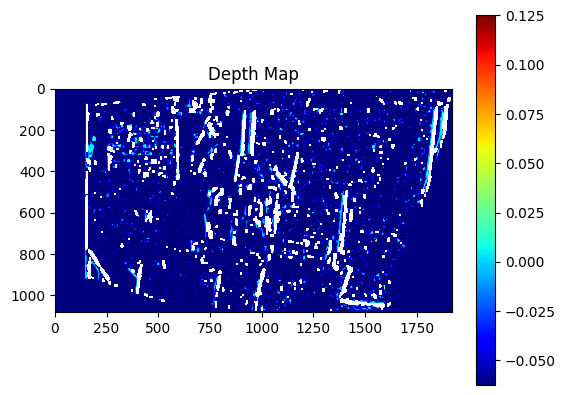

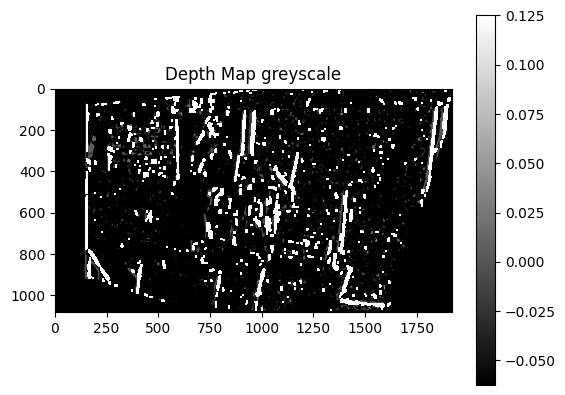

In [ ]:

# Assuming the camera has square pixels, so focal lengths are equal
focal_length = 1746.24

baseline = 678.37
# Create StereoBM object
stereo = cv.StereoBM_create(numDisparities=16, blockSize= 17)

# Compute disparity map
disparity = stereo.compute(img1_rectified, img2_rectified)

# Normalize disparity map for visualization
disparity_normalized = cv.normalize(disparity, None, alpha=0, beta=1, norm_type=cv.NORM_MINMAX, dtype=cv.CV_32F)

# Show the disparity map as grayscale
plt.imshow(disparity_normalized, cmap='gray')
plt.title('Disparity Map')
plt.colorbar()
plt.show()

def disparity_to_depth(baseline, f, img):
    """This is used to compute the depth values from the disparity map"""


    depth_map = np.zeros((img.shape[0], img.shape[1]))
    depth_array = np.zeros((img.shape[0], img.shape[1]))

    for i in range(depth_map.shape[0]):
        for j in range(depth_map.shape[1]):
            depth_map[i][j] = 1/img[i][j]
            depth_array[i][j] = baseline*f/img[i][j]


    return depth_map, depth_array




depth_map,_ = disparity_to_depth(baseline ,focal_length, disparity)

# Show the depth map as heatmap
plt.imshow(depth_map, cmap='jet')
plt.title('Depth Map')
plt.colorbar()
plt.show()

plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map greyscale')
plt.colorbar()
plt.show()